In [1]:
# Import all the libraries required
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px

In [2]:
# Read all the CSV data into a dataframe
loandata_path = "loan.csv"
loan_df = pd.read_csv(loandata_path, encoding = 'latin_1', sep = ',',low_memory=False)
loan_df.shape

(39717, 111)

In [3]:
# gives a gist of loan data frame how the data looks
loan_df.head(2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
# description of all the data available in the dataframe - mean, standard deviation, minimum value, quartile ranges
loan_df.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


Data Cleaning:
cleaning the data so that we donot have data taht doesnt make any significant difference

In [5]:
null_value =round((loan_df.isnull().sum()/len(loan_df)*100),2)
null_value.loc[null_value != 0][0:10]
# All the coulmns and their respective data  percentage of how much data is available is known in the below table

emp_title                  6.19
emp_length                 2.71
desc                      32.58
title                      0.03
mths_since_last_delinq    64.66
mths_since_last_record    92.99
revol_util                 0.13
last_pymnt_d               0.18
next_pymnt_d              97.13
last_credit_pull_d         0.01
dtype: float64

In [6]:
# Checking whichever columns have more than 50% of null values as we cant impute the original data.
column_name_with_null_values= list(null_value.loc[null_value >50].index)
len(column_name_with_null_values)

57

In [7]:
# Removing the columns with 50% of missing data
loan_df= loan_df.drop(column_name_with_null_values, axis=1)
print(loan_df.shape)
# Percentange of the missing / null values in the columns would give us which data can be reduced for better analysis
null_value= round(loan_df.isnull().sum()/len(loan_df)*100,2)
null_value.loc[null_value>0]

(39717, 54)


emp_title                      6.19
emp_length                     2.71
desc                          32.58
title                          0.03
revol_util                     0.13
last_pymnt_d                   0.18
last_credit_pull_d             0.01
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
pub_rec_bankruptcies           1.75
tax_liens                      0.10
dtype: float64

In [8]:
loan_df.nunique().sort_values()
# gives the unique values in each column of the loan data

tax_liens                         1
delinq_amnt                       1
chargeoff_within_12_mths          1
acc_now_delinq                    1
application_type                  1
policy_code                       1
initial_list_status               1
collections_12_mths_ex_med        1
pymnt_plan                        1
term                              2
pub_rec_bankruptcies              3
verification_status               3
loan_status                       3
pub_rec                           5
home_ownership                    5
grade                             7
inq_last_6mths                    9
emp_length                       11
delinq_2yrs                      11
purpose                          14
sub_grade                        35
open_acc                         40
addr_state                       50
issue_d                          55
total_acc                        82
last_pymnt_d                    101
last_credit_pull_d              106
int_rate                    

In [9]:
loan_df =loan_df.drop(['collections_12_mths_ex_med','chargeoff_within_12_mths','tax_liens'],axis=1)

In [10]:
# check uniqueness of brankruptcies column
loan_df.pub_rec_bankruptcies.value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [11]:
null_value= round(loan_df.isnull().sum()/len(loan_df)*100,2)
null_value.loc[null_value!=0]

emp_title                6.19
emp_length               2.71
desc                    32.58
title                    0.03
revol_util               0.13
last_pymnt_d             0.18
last_credit_pull_d       0.01
pub_rec_bankruptcies     1.75
dtype: float64

In [12]:
# removing nulll values from the rows of employee title and employee length
loan_df= loan_df[~(loan_df.emp_title.isnull())]
loan_df= loan_df[~(loan_df.emp_length.isnull())]

In [13]:
# removing the columns of title , revolving line utilization rate  
loan_df= loan_df[~loan_df.title.isnull()]
loan_df= loan_df[~loan_df.revol_util.isnull()]

In [14]:
#delete following columns which are customer behaviour variables. As we are trying to find the defaulters, we wouldnt need the customer behaviour details
loan_df =loan_df.drop(['issue_d','earliest_cr_line','last_pymnt_d','last_credit_pull_d','revol_bal','initial_list_status',
                       'out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp',
                       'total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','last_pymnt_amnt',
                       'policy_code','application_type','acc_now_delinq','delinq_amnt'],axis=1)
loan_df = loan_df.drop(['member_id','installment','pymnt_plan','url','desc','zip_code','delinq_2yrs','inq_last_6mths',
                        ],axis=1)

In [15]:
# delete the details such as years, year, +, <, > values in the term column
loan_df['term'] = loan_df.term.apply(lambda x: x.split()[0])

In [16]:
loan_df.nunique().sort_values()

term                        2
pub_rec_bankruptcies        3
loan_status                 3
verification_status         3
home_ownership              5
pub_rec                     5
grade                       7
emp_length                 11
purpose                    14
sub_grade                  35
open_acc                   40
addr_state                 50
total_acc                  80
int_rate                  368
loan_amnt                 873
funded_amnt              1030
revol_util               1082
dti                      2857
annual_inc               4990
funded_amnt_inv          7800
title                   18362
emp_title               28730
id                      37147
dtype: int64

In [17]:
loan_df.emp_length.value_counts()

10+ years    8533
2 years      4268
< 1 year     4189
3 years      3978
4 years      3348
5 years      3171
1 year       3127
6 years      2154
7 years      1719
8 years      1433
9 years      1227
Name: emp_length, dtype: int64

In [18]:
emp_length_defined = {
    '< 1 year' : 0,
    '1 year' : 1,
    '2 years' : 2,
    '3 years' : 3,
    '4 years' : 4,
    '5 years' : 5,
    '6 years' : 6,
    '7 years' : 7,
    '8 years' : 8,
    '9 years' : 9,
    '10+ years' : 10
}

In [19]:
loan_df.emp_length.value_counts()

10+ years    8533
2 years      4268
< 1 year     4189
3 years      3978
4 years      3348
5 years      3171
1 year       3127
6 years      2154
7 years      1719
8 years      1433
9 years      1227
Name: emp_length, dtype: int64

In [20]:
loan_df = loan_df.replace({"emp_length": emp_length_defined})

In [21]:
loan_df['int_rate'] = loan_df['int_rate'].str.strip('%').astype('float')
loan_df['revol_util'] = loan_df['revol_util'].str.strip('%').astype('float')

In [22]:
loan_df[['int_rate','revol_util']].head()

,int_rate,revol_util
1,15.27,9.4
3,13.49,21.0
4,12.69,53.9
5,7.90,28.3
6,15.96,85.6


In [23]:
loan_df.head()

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,grade,sub_grade,emp_title,emp_length,...,loan_status,purpose,title,addr_state,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
1,1077430,2500,2500,2500.0,60,15.27,C,C4,Ryder,0,...,Charged Off,car,bike,GA,1.00,3,0,9.4,4,0.0
3,1076863,10000,10000,10000.0,36,13.49,C,C1,AIR RESOURCES BOARD,10,...,Fully Paid,other,personel,CA,20.00,10,0,21.0,37,0.0
4,1075358,3000,3000,3000.0,60,12.69,B,B5,University Medical Group,1,...,Current,other,Personal,OR,17.94,15,0,53.9,38,0.0
5,1075269,5000,5000,5000.0,36,7.90,A,A4,Veolia Transportaton,3,...,Fully Paid,wedding,My wedding loan I promise to pay back,AZ,11.20,9,0,28.3,12,0.0
6,1069639,7000,7000,7000.0,60,15.96,C,C5,Southern Star Photography,8,...,Fully Paid,debt_consolidation,Loan,NC,23.51,7,0,85.6,11,0.0


`Lending Club Case - Exploratory Data Analysis`
Columns of the data which are not required for analysis have been deleted(customer behaviour variables).The years coulumn has been cleaned too. text with data 'years','<', '+' have been cleanded only to be as a number. The columns which are available on the loan data are printed below.

In [24]:
master = loan_df
master.head(2)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,grade,sub_grade,emp_title,emp_length,...,loan_status,purpose,title,addr_state,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
1,1077430,2500,2500,2500.0,60,15.27,C,C4,Ryder,0,...,Charged Off,car,bike,GA,1.0,3,0,9.4,4,0.0
3,1076863,10000,10000,10000.0,36,13.49,C,C1,AIR RESOURCES BOARD,10,...,Fully Paid,other,personel,CA,20.0,10,0,21.0,37,0.0


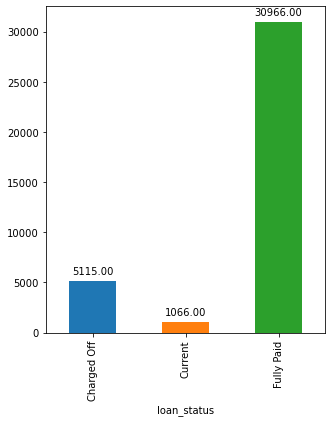

In [61]:
plt.figure(figsize=(5,6))
ax = master.groupby('loan_status').loan_amnt.count().plot.bar()

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

In [62]:
#verification status has three values. Not Verified, Source Verfied and Verified.
# We will change the Source Verified as Verfied
print(master.verification_status.nunique())
master['verification_status'] = master.verification_status.replace('Source Verified','Verified')
master.verification_status.nunique()

2


2

In [63]:
# mean median and quartile details of the master data we have.
master.describe()

,id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,emp_length,annual_inc,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
count,3.714700e+04,37147.000000,37147.000000,37147.000000,37147.000000,37147.000000,3.714700e+04,37147.000000,37147.000000,37147.000000,37147.000000,37147.000000,36493.000000
mean,6.825040e+05,11283.028912,11011.091744,10451.202508,12.052701,4.997389,6.927295e+04,13.399315,9.349746,0.053436,49.167081,22.185049,0.041515
std,2.107552e+05,7419.485539,7155.285027,7098.145446,3.716293,3.546891,6.419220e+04,6.651724,4.391529,0.234400,28.218850,11.383150,0.200440
min,5.574200e+04,500.000000,500.000000,0.000000,5.420000,0.000000,4.000000e+03,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000
25%,5.161085e+05,5600.000000,5500.000000,5000.000000,9.320000,2.000000,4.160000e+04,8.310000,6.000000,0.000000,26.000000,14.000000,0.000000
50%,6.645320e+05,10000.000000,10000.000000,9000.000000,11.860000,4.000000,6.000000e+04,13.500000,9.000000,0.000000,49.700000,21.000000,0.000000
75%,8.372640e+05,15000.000000,15000.000000,14400.000000,14.590000,9.000000,8.300000e+04,18.650000,12.000000,0.000000,72.600000,29.000000,0.000000
max,1.077430e+06,35000.000000,35000.000000,35000.000000,24.400000,10.000000,6.000000e+06,29.990000,44.000000,4.000000,99.900000,90.000000,2.000000


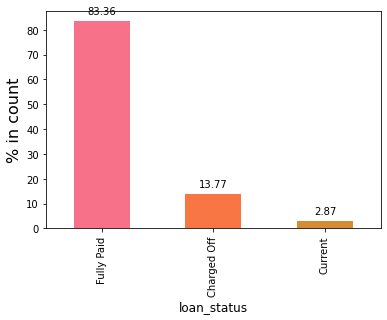

In [64]:
# understanding the overall data set.
values = (master['loan_status'].value_counts(normalize=True)*100)
ax = values.plot.bar(color=sns.color_palette('husl', 18))
ax.set_ylabel('% in count', fontsize=16)
ax.set_xlabel('loan_status', fontsize=12)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')


The above graph shows us the percentage of each loan status amonng the loan data <br>
* Fully Paid = 83.3% <br>
* Charged  / defaulted = 13.7% <br>
* Current = 2.8% <br>

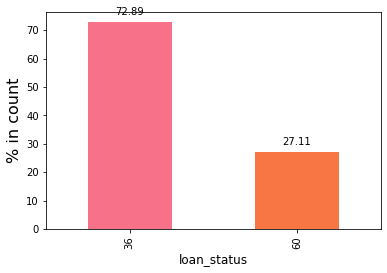

In [29]:
values = (master['term'].value_counts(normalize=True)*100)
ax = values.plot.bar(color=sns.color_palette('husl', 18))
ax.set_ylabel('% in count', fontsize=16)
ax.set_xlabel('loan_status', fontsize=12)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

1. Loans with 36 months tenure are significantly high in number <br>
2. maximum percentage (73%) of the total loans are under 36 months tenure
3. In the above graph of term status, when the term status is 60 months ,
the loans charged off amount to 22% of the total 60 months term count.
<br>
4. the charged off loans in the 36 months amounting to 12% of the total 36 months tenure loans

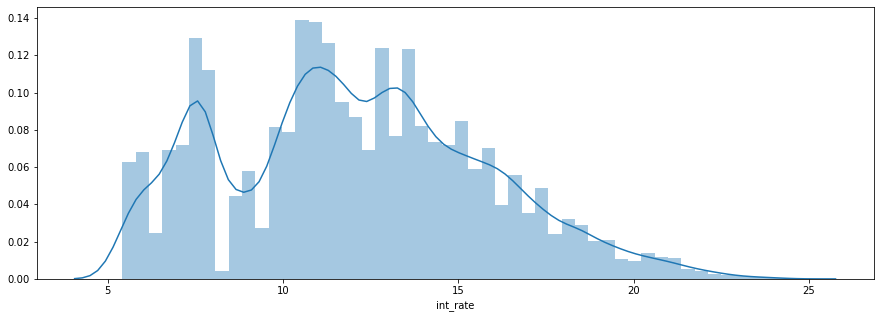

In [66]:
# ax = sns.distplot(master["int_rate"])
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontweight='light',fontsize='x-large')
    
# plt.show()

plt.figure(figsize=(15,5))
ax = sns.distplot(master["int_rate"])
plt.show()

Most of the loans are in the interest bracket of 6 - 17.99%

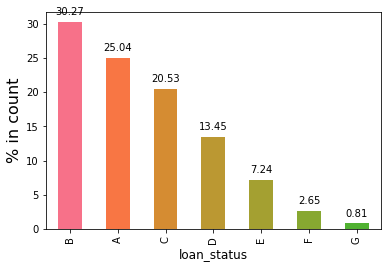

In [31]:
# fig4 = px.histogram(master,x="grade",color = 'grade',width = 250, height = 500,nbins = 5)
# fig4.show()
values = (master['grade'].value_counts(normalize=True)*100)
ax = values.plot.bar(color=sns.color_palette('husl', 18))
ax.set_ylabel('% in count', fontsize=16)
ax.set_xlabel('loan_status', fontsize=12)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

The maximum loans are in the grades of B, A and C respectively. <br>

In [32]:
master.head(2)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,grade,sub_grade,emp_title,emp_length,...,loan_status,purpose,title,addr_state,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
1,1077430,2500,2500,2500.0,60,15.27,C,C4,Ryder,0,...,Charged Off,car,bike,GA,1.0,3,0,9.4,4,0.0
3,1076863,10000,10000,10000.0,36,13.49,C,C1,AIR RESOURCES BOARD,10,...,Fully Paid,other,personel,CA,20.0,10,0,21.0,37,0.0


In [33]:
fig5 = px.histogram(master,x="emp_length",width = 400, height = 300)
fig5.show()

Employees with the experience of 10+ years tend to have more loans when compared to other experienced categories

0-4 years = 51% of loans - out of which 15% are charged off <br>
5-9 years =  25.9% of loans - out of which 16% are charged off <br>
10-14 years =  22.9% loans - out of which 18% are charged off <br>

In [34]:
fig6 = px.histogram(master,x="home_ownership",color = 'loan_status',width = 400, height = 900,nbins = 3)
fig6.show()

The borrowers who tend to have a Rented Stay followed by home with Mortagage are more in count <br>
Rent = 48% - out of which 14% loans are charged off<br>
Mortagage = 44.5% - out of which 12% loans are chargedoff<br>
Own = 7%  - out of which 13% loans are charged off<br>
Other = 0.24% <br>
None = negligible <br>

In [35]:
groups = master.groupby(pd.cut(master['annual_inc'], [0,5000,10000,50000,100000,500000,1000000,6.000000e+06]))
groups.annual_inc.count()

annual_inc
(0.0, 5000.0]                 4
(5000.0, 10000.0]            53
(10000.0, 50000.0]        14317
(50000.0, 100000.0]       17467
(100000.0, 500000.0]       5244
(500000.0, 1000000.0]        48
(1000000.0, 6000000.0]       14
Name: annual_inc, dtype: int64


The maximum loans have been taken by people whose annual income range is between the following

1. 50k - 100k - (46%)
2. 10k - 50k -  (38.5%)
3. 100k - 100k -(14.1%)

In [36]:
fig7 = px.histogram(master,x="verification_status",color = 'loan_status',width = 400, height = 300)
fig7.show()

Out of all the loans below is the verification status

1. Verified -  (57.6%)
2. Not verified -  (42.3%)

In [37]:
fig8 = px.histogram(master,x="purpose",width = 500, height = 400, histnorm = 'percent')
fig8.show()

Most of the Loans have been borrowed for the sake of the following purposes (ranked below)
1. Debt_consolidation (47.9%)
2. Credit_card (12.9%)
3. Other Purposes (9.9%)

In [38]:
fig9 = px.histogram(master,x="pub_rec_bankruptcies",width = 500, height = 400, histnorm = 'percent')
fig9.show()

bankruptcies : Out of the whole data available <br>
    1. bankrupcty once - 4.1% of loans 
    2. bankrupcty twice - negligible % on whole data set
    

In [39]:
fig10 = px.histogram(master,x="addr_state", color = 'loan_status',width = 900, height = 400, histnorm = 'percent')
fig10.show()

the state CA has high number of loans, followed by NY and then by FL

In [40]:
# Considering data so that only charged off loans are available for analysis
chargedoff = master[master['loan_status'] == 'Charged Off' ]

In [41]:
chargedoff.head(2)

,id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,grade,sub_grade,emp_title,emp_length,...,loan_status,purpose,title,addr_state,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
1,1077430,2500,2500,2500.0,60,15.27,C,C4,Ryder,0,...,Charged Off,car,bike,GA,1.00,3,0,9.4,4,0.0
9,1071570,5375,5375,5350.0,60,12.69,B,B5,Starbucks,0,...,Charged Off,other,Building my credit history.,TX,18.08,2,0,36.5,3,0.0


In [42]:
# below are the mean median standard deviation and quartile details of the charged off loan data
chargedoff.describe()

,id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,emp_length,annual_inc,dti,open_acc,pub_rec,revol_util,total_acc,pub_rec_bankruptcies
count,5.115000e+03,5115.000000,5115.000000,5115.000000,5115.000000,5115.000000,5.115000e+03,5115.000000,5115.000000,5115.000000,5115.000000,5115.000000,5003.000000
mean,6.981147e+05,12254.789834,11901.168133,10980.470174,13.879613,5.133138,6.300069e+04,14.095406,9.289932,0.082307,55.940438,21.611144,0.064162
std,2.175044e+05,8054.256720,7735.475305,7644.951601,3.629710,3.578559,4.769336e+04,6.541546,4.512942,0.281883,27.706870,11.456824,0.246691
min,6.141900e+04,900.000000,900.000000,0.000000,5.420000,0.000000,4.080000e+03,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000
25%,5.308660e+05,6000.000000,6000.000000,5000.000000,11.460000,2.000000,3.839850e+04,9.240000,6.000000,0.000000,35.100000,13.000000,0.000000
50%,7.009680e+05,10000.000000,10000.000000,9600.000000,13.610000,5.000000,5.400000e+04,14.400000,9.000000,0.000000,58.800000,20.000000,0.000000
75%,8.560645e+05,17000.000000,16000.000000,15000.000000,16.450000,9.000000,7.500000e+04,19.300000,12.000000,0.000000,79.150000,29.000000,0.000000
max,1.077430e+06,35000.000000,35000.000000,35000.000000,24.400000,10.000000,1.250000e+06,29.850000,38.000000,2.000000,99.900000,70.000000,2.000000


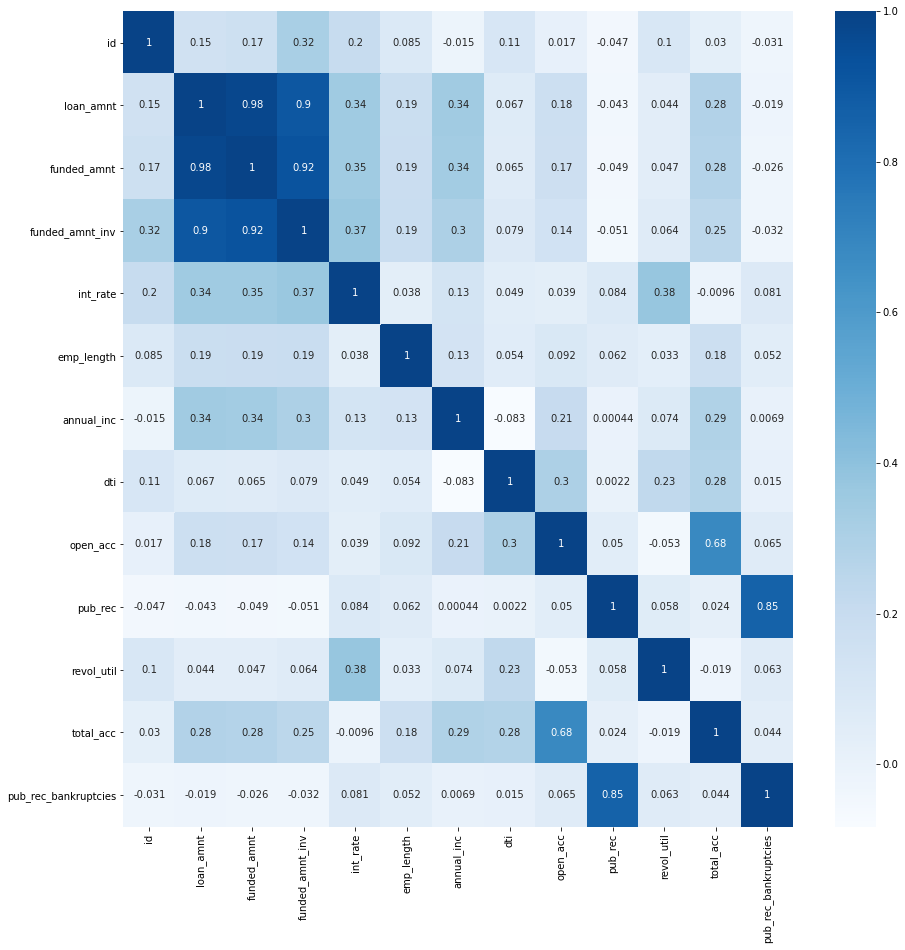

In [43]:
plt.figure(figsize=(15,15))
correlation = chargedoff.corr()
sns.heatmap(correlation, annot=True, center=0.5, cmap= 'Blues')

Above map gives the correlation between the data.

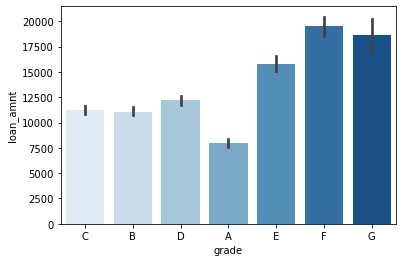

In [44]:
sns.barplot(x='grade', y='loan_amnt', data=chargedoff, palette="Blues")
plt.show()

The charged off loans with more loan amounts are under the grades of F , G and E

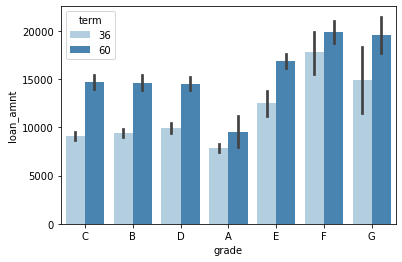

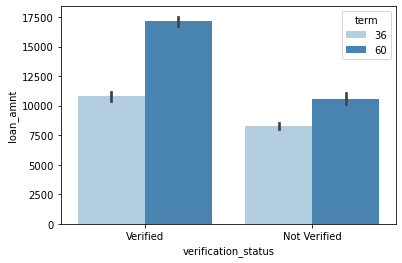

In [45]:
#sns.color_palette("Blues")
sns.barplot(x='grade', y='loan_amnt', hue="term", data=chargedoff, palette="Blues")
plt.show()
sns.barplot(x='verification_status', y='loan_amnt', hue="term", data=chargedoff, palette="Blues")
plt.show()

Across the grades, the term 60 months loans are more defaulters than the 36 months.

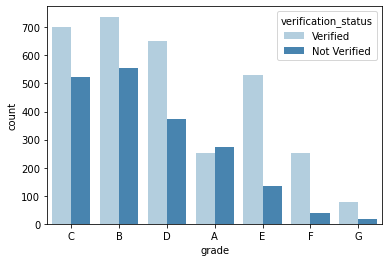

In [46]:
sns.countplot(x='grade', hue = 'verification_status',data=chargedoff, palette="Blues")
plt.show()

Grade A has the highest category of non verified loans
Grades B, C , A have significantly high non verified loans which are defaulted

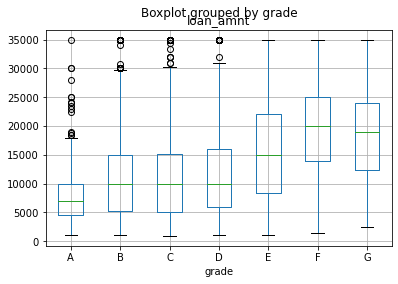

In [47]:
chargedoff.boxplot(column='loan_amnt', by='grade')

In [48]:
groups = chargedoff.groupby(pd.cut(chargedoff['annual_inc'], [0,5000,10000,50000,100000,500000,1000000,6.000000e+06]))
groups.annual_inc.count()

annual_inc
(0.0, 5000.0]                1
(5000.0, 10000.0]           12
(10000.0, 50000.0]        2295
(50000.0, 100000.0]       2260
(100000.0, 500000.0]       537
(500000.0, 1000000.0]        9
(1000000.0, 6000000.0]       1
Name: annual_inc, dtype: int64

In [49]:
fig9 = px.histogram(chargedoff,x="pub_rec_bankruptcies",width = 500, height = 400, histnorm = 'percent')
fig9.show()

State with defaulters with higher amount of funded amount are are WY, AL, WI, AK

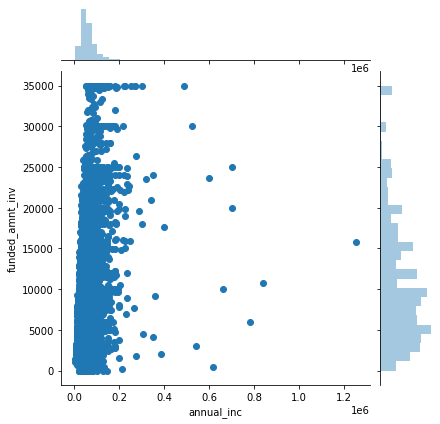

In [50]:
sns.jointplot('annual_inc', 'funded_amnt_inv', chargedoff)

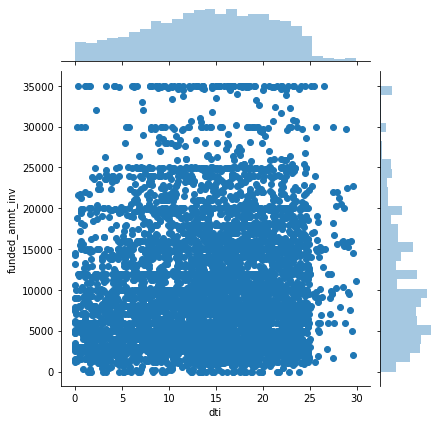

In [51]:
sns.jointplot('dti', 'funded_amnt_inv', chargedoff)

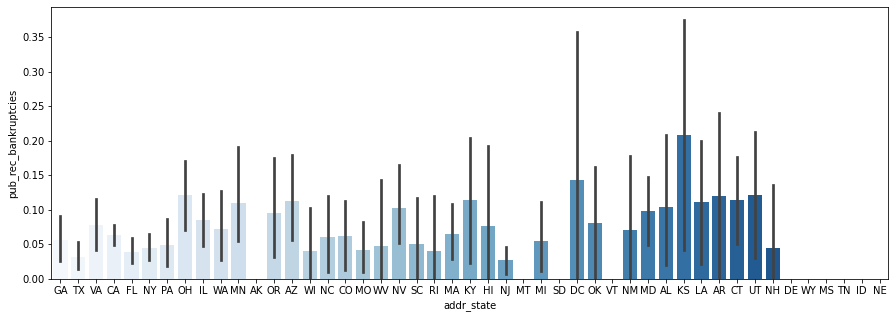

In [52]:
plt.figure(figsize=(15,5))
sns.barplot(x='addr_state',y = 'pub_rec_bankruptcies',data=chargedoff, palette = 'Blues')
plt.show()


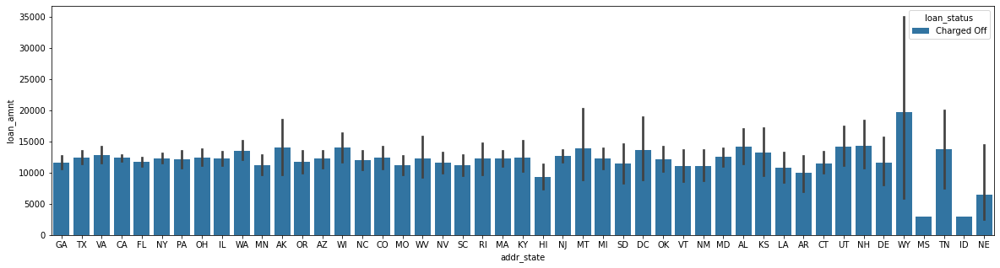

In [53]:
plt.figure(figsize=(20,5))
sns.barplot(x='addr_state', y='loan_amnt', hue='loan_status',data=chargedoff, estimator=np.mean)
plt.show()

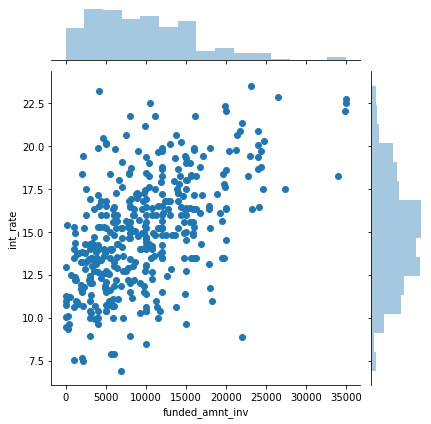

In [54]:
sns.jointplot('funded_amnt_inv', 'int_rate', chargedoff.loc[chargedoff.pub_rec > 0])

In [59]:
fig8 = px.histogram(chargedoff,x="purpose",width = 500, height = 400, histnorm = 'percent')
fig8.show()

In [56]:
fig6 = px.histogram(chargedoff,x="verification_status",width = 400, height = 400)
fig6.show()